Name: __________________        Class: __________________     Date: __________________

<center>
    <img width="100%" src="https://raw.githubusercontent.com/astroDimitrios/AstronomyClass/master/DesignAssets/Ai/Banner3plainCut.png" alt='AP Logo'>
</center>

# Team Seas - River Pollution

### AIM - To analyse plastic discharge by rivers using data from the Ocean Cleanup Project
Difficulty: Easy

## Start:

This activity is inspired by the work of the [Ocean Cleanup Project](https://theoceancleanup.com/) and #TeamSeas started by YouTubers [MrBeast](https://www.youtube.com/watch?v=cV2gBU6hKfY) and [Mark Rober](https://www.youtube.com/watch?v=pXDx6DjNLDU). It uses data from Meijer L. J. J. et al., 2021, *Sci. Adv.*, More than 1000 rivers account for 80% of global riverine plastic emissions into the ocean, DOI: [10.1126/sciadv.aaz5803](10.1126/sciadv.aaz5803) which is provided [here](https://figshare.com/articles/dataset/Supplementary_data_for_More_than_1000_rivers_account_for_80_of_global_riverine_plsatic_emissions_into_the_ocean_/14515590) and has been downloaded into the Meijer2021_midpoint_emissions directory for this activity.

Explore the Ocean Cleanup Projects' interactive map version of this data on their website [here](https://theoceancleanup.com/sources/).

You can see the full #TeamSeas campaign to remove plastic from the Ocean [here](https://teamseas.org/) (I am in no way affiliated with any campaigns or organisations listed above).

## Contents

* [Start](#Start)
* [Exploring with GeoPandas](#BuiltIn)
* [Plotting 100 Worst Pollutors](#100Worst)
* [Pollution by Country](#Country)
* [Local River Data](#Local)
* [Your Local Rivers](#YourLocal)
* [Over to You](#OTY)
* [References](#REF)
* [Acknowledgements](#ACK)


## Let's Go: <a class="anchor" id="Start"></a>

We are going to explore this river pollution dataset using **[GeoPandas](https://geopandas.org/en/stable/)**. GeoPandas is built on Pandas and allows us to work with geospatial data.

You will need to have **GeoPandas**, **[contextily](https://contextily.readthedocs.io/en/latest/)**, **matplotlib + ipywidgets**, and **[adjustText](https://github.com/Phlya/adjustText)** installed to run all the code.

In [1]:
# run me
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx

from geopandas.tools import sjoin
from numpy import log
from adjustText import adjust_text

%matplotlib widget

We can use GeoPandas to read in the special shapefile which contains our geospatial data. Go ahead and run the next code cell.

In [2]:
# run me
rivers = gpd.read_file("./Meijer2021_midpoint_emissions/Meijer2021_midpoint_emissions.shp")

Let's look and see how many rivers are in the dataset using ```.shape```.

In [3]:
# run me
rivers.shape

(31819, 2)

There are 31,819 rivers included in this dataset! Let's look at the first 5 rows using ```.head()```.

In [4]:
# run me
rivers.head()

,dots_exten,geometry
0,0.164904,POINT (168.79792 -46.58083)
1,0.124932,POINT (168.34875 -46.44708)
2,1.213370,POINT (168.33708 -46.41875)
3,0.121138,POINT (168.02125 -46.35792)
4,0.197533,POINT (169.81125 -46.34375)


The **dots_exten** column tells us the total annual plastic emissions in metric tons and the **geometry** column contains the POINTs showing the locations of all the rivers.

It would be good to know the maximum and minimum values of **dots_exten**. Use the next two code cells to print out the *min* and *max* values. Treat ```rivers``` as a normal Pandas DataFrame.

In [5]:
# print out the min dots_exten value
rivers['dots_exten'].min()

0.0

In [6]:
# print out the max dots_exten value
rivers['dots_exten'].max()

62591.9

At least one river in the dataset has no or close to $0\ T$ of plastic pollution.     
On the other hand the max polluting river is emitting $62,591.9\ T$ of plastic each year!

Before we move on we should know which Coordinate Reference System (CRS) the data is stored in. Run the code below.

In [7]:
# run me
rivers.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The CRS is WGS 84 which is the latitude longitude projection. More info on reference systems can be found [here](https://geopandas.org/en/stable/docs/user_guide/projections.html).

## Exploring with GeoPandas <a class="anchor" id="BuiltIn"></a>

There are two easy tools which we can use to visualise this dataset.
The first is calling ```.plot()``` on our GeoPandas dataset. This will plot all the river points using Matplotlib.

Run the code below to see the figure.

<AxesSubplot:>

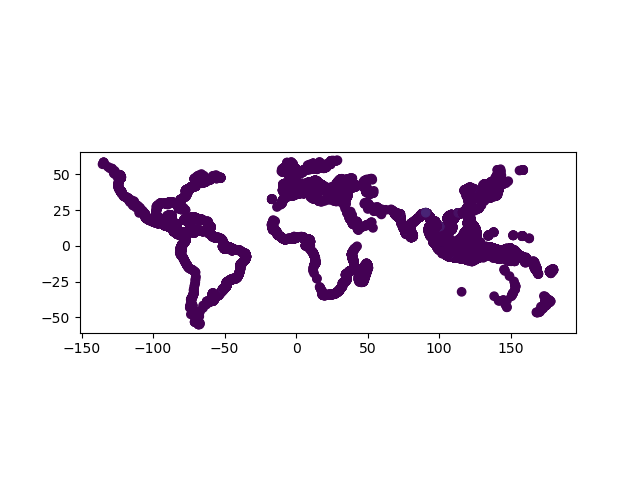

In [8]:
# run me
rivers.plot(column='dots_exten')

This is great to quickly visualise the data but it looks terrible and has no scale/colourbar!

We can use ```.explore()``` to create an interactive figure of our data.     
This figure may be slow to repond to hover/panning etc. since the dataset is so large!

In [9]:
# run me
rivers.explore()

If you feel later on that the figure above is slowing the notebook down restart the kernel and skip the cell above when re-running the previous code.

## Plotting 100 Worst Pollutors <a class="anchor" id="100Worst"></a>

We are going to build our own plot where we can highlight certain rivers.

Let's say we want the 100 largest polluting rivers.
Complete the code below to select those rivers.

In [10]:
# Hint: the dots_exten column gives the amount of pollution
big_rivers = rivers.sort_values(by=['dots_exten'],ascending=False).head(100)
big_rivers

,dots_exten,geometry
12639,62591.90,POINT (120.95708 14.59542)
12656,13450.20,POINT (120.94833 14.64958)
16880,13432.90,POINT (72.91292 19.28958)
13361,12816.00,POINT (101.38875 3.00292)
12693,12398.30,POINT (120.90042 14.71708)
...,...,...
18679,1297.19,POINT (89.53208 22.74292)
11025,1294.12,POINT (122.38750 11.72792)
12286,1290.58,POINT (121.63458 13.90958)
17615,1285.10,POINT (72.70958 21.13458)


Now let's see what percentage of the total plastic emission is from just those rivers.

In [11]:
# calcualte the sum of dots_exten for rivers then big_rivers
total = rivers['dots_exten'].sum()
big_total = big_rivers['dots_exten'].sum()

# print out the % of the total pollution from just the big_rivers
print(f'{big_total/total:.1%}')

34.4%


Wow such a large percentage from so few rivers. Let's plot these on a new figure alongside all rivers.

The following code assigns sizes to river points based off their pollution values.

In [12]:
# run me
sizes = log(rivers['dots_exten']+1)*20      # sizes for all rivers
big_sizes = big_rivers['dots_exten']/25     # sizes for big rivers

We can add a continent basemap under our data by loading in the natural Earth dataset from GeoPandas.

In [13]:
# run me
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."
...,...,...,...,...,...,...
172,7111024,Europe,Serbia,SRB,101800.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,642550,Europe,Montenegro,MNE,10610.0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009..."
174,1895250,Europe,Kosovo,-99,18490.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."


Now all we have to do is set up our plot.
Complete the code below to also plot the ```big_rivers``` data just like is shown for ```rivers```.

- Plot the ```big_rivers``` data
- Make sure the markers are a different colour
- Use the ```big_sizes``` array for the markersize
- Use a higher alpha value so they are more visible

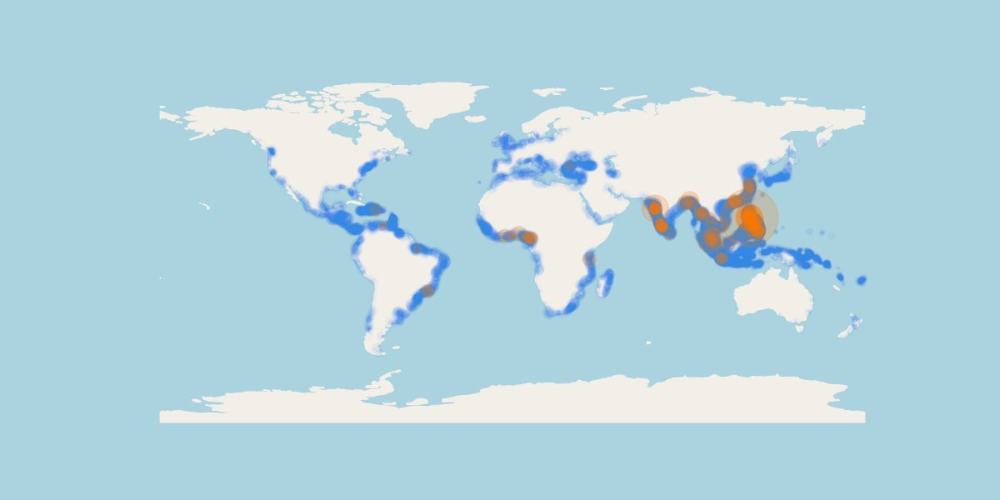

In [14]:
# run me
cont_colour = '#F2EFE8'     # continent colour
ocean_colour = '#ABD3DF'    # ocean colour  

fig, ax = plt.subplots(figsize=(12,6))

# facecolour is the ocean!
fig.set_facecolor(ocean_colour)
# add continents basemap
world.plot(ax=ax, color=cont_colour, edgecolor=cont_colour)

rivers.plot(ax=ax, marker='o', color='#3289FD', markersize=sizes, alpha=.02)
big_rivers.plot(ax=ax, marker='o', color='#FF7700', markersize=big_sizes, alpha=.2)

ax.set_aspect('equal')
ax.set_axis_off()

If you're happy with this figure save it using the code cell below.     
Change the name to something meaningful!

In [15]:
plt.savefig('./river_plastics_WORLD.png', dpi=200, bbox_inches='tight', pad_inches = 0)

## Pollution by Country <a class="anchor" id="Country"></a>

So far we have plotted all the rivers and the biggest 100. What about the countries that are the biggest polluters?

To get this data and plot it we will have to merge our ```rivers``` DataFrame with the ```world``` DataFrame which contains contry info.

Use the ```sjoin(df1, df2, how='right')``` function to join these two datasets into a new ```river_country``` DataFrame below:

In [16]:
# join right will keep the geometry column from the world DataFrame
river_country = sjoin(rivers, world, how='right')
river_country

,index_left,dots_exten,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,144.0,0.378571,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
0,145.0,0.367290,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
0,147.0,0.378161,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
0,148.0,0.250080,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
0,149.0,0.963590,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
...,...,...,...,...,...,...,...,...
175,27656.0,0.787877,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."
175,27657.0,1.184210,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."
175,27658.0,0.354722,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."
175,27659.0,0.650863,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."


Now each river has an associated country in the ```'name'``` column.
We can use the ```.grouby()``` function to keep only the ```'name', 'continent', 'pop_est', 'gdp_md_est'``` columns and sum over ```'dots_exten'```. This will gives us the total pollution for each country.

In [17]:
# run me
country_plastics = river_country.groupby(['name', 'continent', 'pop_est', 'gdp_md_est'], as_index=False)['dots_exten'].sum()
country_plastics

,name,continent,pop_est,gdp_md_est,dots_exten
0,Afghanistan,Asia,34124811,64080.0,0.000000
1,Albania,Europe,3047987,33900.0,1341.740726
2,Algeria,Africa,40969443,609400.0,4909.685818
3,Angola,Africa,29310273,189000.0,847.998120
4,Antarctica,Antarctica,4050,810.0,0.000000
...,...,...,...,...,...
172,W. Sahara,Africa,603253,906.5,0.000000
173,Yemen,Asia,28036829,73450.0,239.186761
174,Zambia,Africa,15972000,65170.0,0.000000
175,Zimbabwe,Africa,13805084,28330.0,0.000000


This ```country_plastics``` DataFrame has data from the original ```World``` DataFrame and a value for the total plastic emissions in metric tons in the ```dots_exten``` column.

The only thing we are missing is the geometry values for each country so we can plot them.    
Select only the ```'name'``` and ```'geometry'``` columns from ```world``` and store them in ```country_geometry```.

In [18]:
country_geometry = world[['name', 'geometry']]
country_geometry

,name,geometry
0,Fiji,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,Tanzania,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,W. Sahara,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Canada,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,United States of America,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."
...,...,...
172,Serbia,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,Montenegro,"POLYGON ((20.07070 42.58863, 19.80161 42.50009..."
174,Kosovo,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,Trinidad and Tobago,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."


All that's left is to join the ```country_plastics``` and ```country_geometry``` DataFrames on the ```'name'``` column.

In [19]:
# merge the two dataframes
country_plastics = country_plastics.merge(country_geometry, on='name')
country_plastics

,name,continent,pop_est,gdp_md_est,dots_exten,geometry
0,Afghanistan,Asia,34124811,64080.0,0.000000,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
1,Albania,Europe,3047987,33900.0,1341.740726,"POLYGON ((21.02004 40.84273, 20.99999 40.58000..."
2,Algeria,Africa,40969443,609400.0,4909.685818,"POLYGON ((-8.68440 27.39574, -8.66512 27.58948..."
3,Angola,Africa,29310273,189000.0,847.998120,"MULTIPOLYGON (((12.99552 -4.78110, 12.63161 -4..."
4,Antarctica,Antarctica,4050,810.0,0.000000,"MULTIPOLYGON (((-48.66062 -78.04702, -48.15140..."
...,...,...,...,...,...,...
172,W. Sahara,Africa,603253,906.5,0.000000,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
173,Yemen,Asia,28036829,73450.0,239.186761,"POLYGON ((52.00001 19.00000, 52.78218 17.34974..."
174,Zambia,Africa,15972000,65170.0,0.000000,"POLYGON ((30.74001 -8.34001, 31.15775 -8.59458..."
175,Zimbabwe,Africa,13805084,28330.0,0.000000,"POLYGON ((31.19141 -22.25151, 30.65987 -22.151..."


Before we move on check that the population and gdp data hasn't been altered! You might like to play around with it later.

Print out the row in ```world``` for Albania and check against ```country_plastics``` above. If all is good they should contain the same population and gdp values.

In [20]:
# Hint: use the .loc[] fucntion
world.loc[world['name']=='Albania']

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
125,3047987,Europe,Albania,ALB,33900.0,"POLYGON ((21.02004 40.84273, 20.99999 40.58000..."


Now we can plot a chloropleth map which will colour each country based on their pollution. Run the code below to generate the plot.

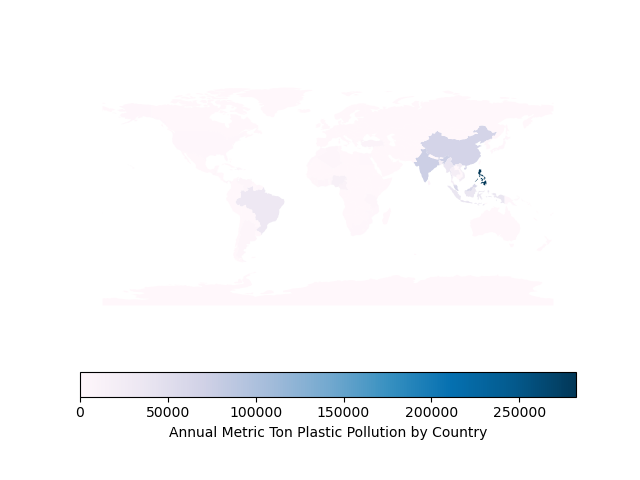

In [21]:
# run me
fig, ax = plt.subplots(1, 1)
country_plastics.plot(column = 'dots_exten',
                     cmap='PuBu',
                     ax = ax,
                     legend = True,
                     legend_kwds = {'label': "Annual Metric Ton Plastic Pollution by Country",
                                   'orientation': "horizontal"})
ax.set_axis_off();

This plot makes it look like only 4-5 countries are polluting!

This is obviously not true. Most countries data lies well below $50,000\ T$ so a few outliers are distorting our visualisation with this colourscheme. Let's print the 10 worst offenders.

In [22]:
# select the largest 10 rows in country_plastics by their dots_exten value
country_plastics.sort_values(by=['dots_exten'],ascending=False).head(10)

,name,continent,pop_est,gdp_md_est,dots_exten,geometry
125,Philippines,Asia,104256076,801900.0,282350.934350,"MULTIPOLYGON (((120.83390 12.70450, 120.32344 ..."
71,India,Asia,1281935911,8721000.0,74814.153066,"POLYGON ((97.32711 28.26158, 97.40256 27.88254..."
31,China,Asia,1379302771,21140000.0,65143.504280,"MULTIPOLYGON (((109.47521 18.19770, 108.65521 ..."
97,Malaysia,Asia,31381992,863000.0,61479.780902,"MULTIPOLYGON (((100.08576 6.46449, 100.25960 6..."
72,Indonesia,Asia,260580739,3028000.0,38295.164685,"MULTIPOLYGON (((141.00021 -2.60015, 141.01706 ..."
106,Myanmar,Asia,55123814,311100.0,36886.211659,"POLYGON ((100.11599 20.41785, 99.54331 20.1866..."
20,Brazil,South America,207353391,3081000.0,32064.388547,"POLYGON ((-53.37366 -33.76838, -53.65054 -33.2..."
171,Vietnam,Asia,96160163,594900.0,22901.583973,"POLYGON ((104.33433 10.48654, 105.19991 10.889..."
155,Thailand,Asia,68414135,1161000.0,18866.807058,"POLYGON ((105.21878 14.27321, 104.28142 14.416..."
11,Bangladesh,Asia,157826578,628400.0,18516.081246,"POLYGON ((92.67272 22.04124, 92.65226 21.32405..."


We can change how our data is coloured by specifying the ```scheme```.
Let's see if using quantiles to colour our data helps.

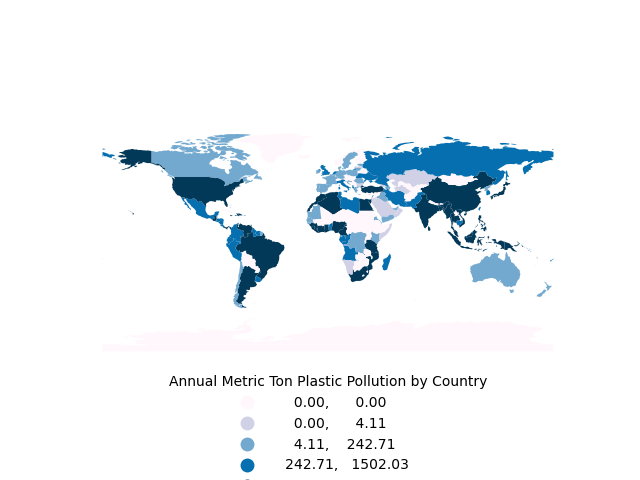

In [23]:
# run me
fig, ax = plt.subplots(1, 1)
country_plastics.plot(column = 'dots_exten',
                     cmap='PuBu',
                     scheme='quantiles',
                     ax = ax,
                     legend = True,
                     legend_kwds = {'title': "Annual Metric Ton Plastic Pollution by Country",
                                   'frameon': False,
                                   'loc': 'upper center',
                                   'bbox_to_anchor': (0.5, 0)})

ax.set_axis_off();

Better but still not great - the largest quantile has collated loads of countries with a huge range of pollution values. Before we try moving to other schemes save this figure for reference.

Remember to chose a sensible name.

In [24]:
plt.savefig('./river_plastics_WORLD_quantiles.png', dpi=200, bbox_inches='tight', pad_inches = 0)

A list of schemes which alter how the data is binned and coloured can be found [here](https://geopandas.org/en/stable/docs/user_guide/mapping.html). Change the scheme to see if there is a better one to represent our data.

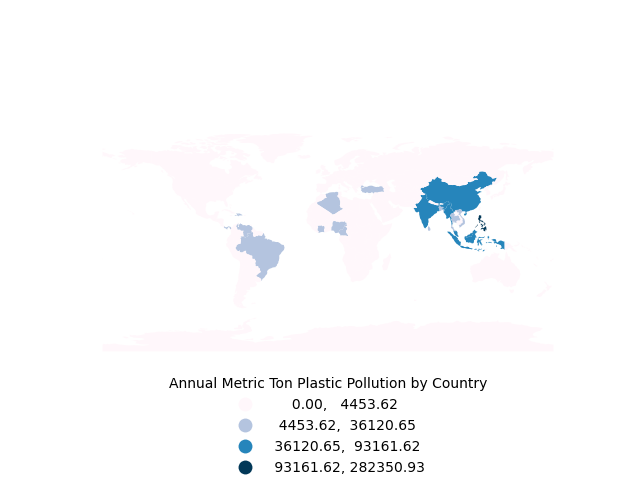

In [25]:
fig, ax = plt.subplots(1, 1)
country_plastics.plot(column = 'dots_exten',
                     cmap='PuBu',
                     scheme='headtail_breaks',
                     ax = ax,
                     legend = True,
                     legend_kwds = {'title': "Annual Metric Ton Plastic Pollution by Country",
                                   'frameon': False,
                                   'loc': 'upper center',
                                   'bbox_to_anchor': (0.5, -0.01)})

ax.set_axis_off();

In [26]:
plt.savefig('./river_plastics_WORLD_headtailbreaks.png', dpi=200, bbox_inches='tight', pad_inches = 0)

Tricky! One of the challenges at the end of this acitivity is to break up the plot so high pollutors are plotted separately with a different colourscheme to low polluting countries.

## Local River Data <a class="anchor" id="Local"></a>

Let's now look at some rivers local to you or your country.

We can split up the geometry column in ```rivers``` to create columns for longitude and latitude with the code below.

In [27]:
# run me
rivers['lon'] = rivers['geometry'].x
rivers['lat'] = rivers['geometry'].y

For the South / South East UK I know I roughly need latitude values between $50^{\circ}$ and $52^{\circ}$ and longitude values between $-2^{\circ}$ and $2^{\circ}$.

Run the following code to select rivers in this part of the UK. You will be able to enter your own region later.

In [28]:
# run me
seuk_rivers = rivers[rivers['lon'].between(-2, 2, inclusive='neither')]
seuk_rivers = seuk_rivers[seuk_rivers['lat'].between(50, 52, inclusive='neither')]
seuk_rivers.head()

,dots_exten,geometry,lon,lat
24527,1.233090,POINT (1.37875 50.06375),1.378750,50.063750
24532,3.802940,POINT (1.63292 50.19042),1.632917,50.190417
24536,0.112295,POINT (1.64833 50.21625),1.648333,50.216250
24537,0.162305,POINT (1.63125 50.21667),1.631250,50.216667
24549,0.685667,POINT (1.60667 50.36958),1.606667,50.369583


Let's see how many rivers we are left with:

In [29]:
# run me
len(seuk_rivers)

77

Now we can plot the rivers.

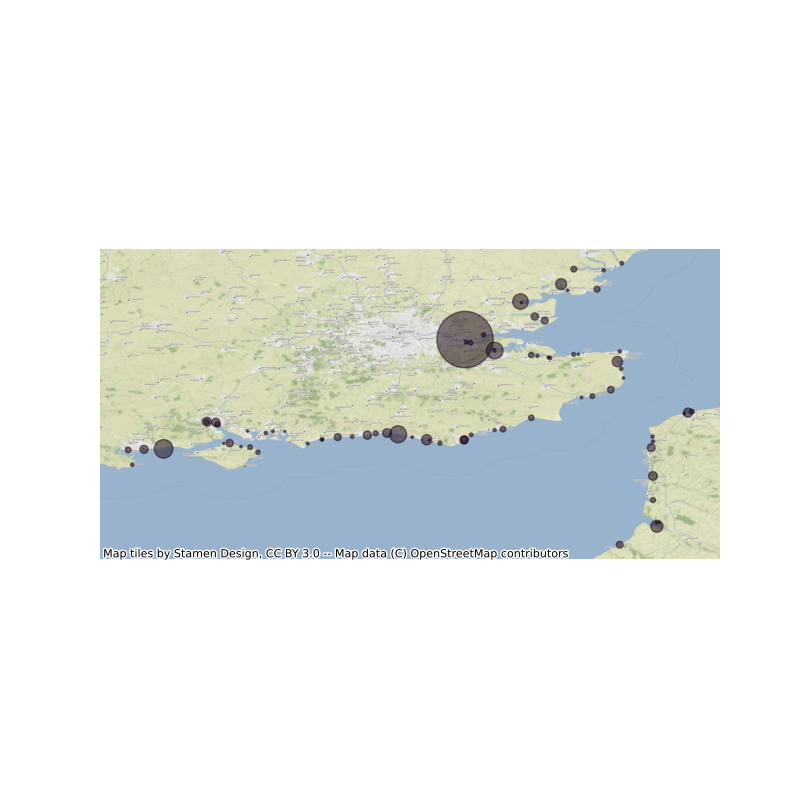

In [30]:
# run me
seuk_sizes = seuk_rivers['dots_exten']*20

fig, ax = plt.subplots(figsize=(8, 8))
seuk_rivers.plot(ax=ax, marker='o', color='#170312', markersize=seuk_sizes, alpha=.5)
cx.add_basemap(ax, crs=seuk_rivers.crs, zoom=10)
ax.set_aspect('equal')
ax.set_axis_off()

In [31]:
plt.savefig('./river_plastics_SEUK.png', dpi=200, bbox_inches='tight', pad_inches = 0)

### Your Local Rivers <a class="anchor" id="YourLocal"></a>

Before we move on head over to [OpenStreetMap](https://www.openstreetmap.org/directions). Navigate to an area of coastline you would like to focus on. 

Drag the Green marker to the top right of the area. Drag the Red marker to the bottom left of the area. This will display the lat, lon values in the top left directions box.

Go ahead and:
- Select an area using OpenStreetMap
- Note down the min and max latitude values
- Note down the min and max longitude values
- Run the code below

In [32]:
# run me
world_total = rivers['dots_exten'].sum()

def local_rivers(lat_min, lat_max, lon_min, lon_max, conf):
    """Plots local river data
    
    Takes the min/max lat/long values and makes a plot of that region
    Displays text at top of total emission in picture and as a percentage of world total
    Also labels each river with their plastic emission in metric tons
    
    Args:
        lat_min -- float, minimum latitude for figure
        lat_max -- float, maximum latitude for figure
        lon_min -- float, minimum longitude for figure
        lon_max -- float, maximum longitude for figure
        conf -- dictionary, controls optional parameters
                default values shown in example below
        
    Returns:
        Nothing - displays the figure
        
    Example:
        >>> local_config = {
                'color' : '#170312',     # river marker colour
                'scale' : 1,             # scale to change marker size
                'zoom' : 10,             # level of detail for basemap
                'zoom2' : 9,             # level of detail for basemap labels only if style != Terrain
                'alpha' : .5,            # alpha for markers
                'bg_alpha' : 1,          # alpha for basemap
                'style': 'Terrain'       # style for basemap Terrain or Watercolour
                }

        >>> local_rivers(50.6, 51.6, .4, 1.6, local_config)
    """
    
    col = conf.get('color', '#170312')
    scale = conf.get('scale', 1)
    zoom = conf.get('zoom', 10)
    a = conf.get('alpha', .5)
    ba = conf.get('bg_alpha', 1)
    style = conf.get('style', 'Terrain')
    
    loc_rivers = rivers[rivers['lat'].between(lat_min, lat_max, inclusive='neither')]
    loc_rivers = loc_rivers[loc_rivers['lon'].between(lon_min, lon_max, inclusive='neither')]
    loc_sizes = loc_rivers['dots_exten']*20*scale
    
    fig, ax = plt.subplots(figsize=(8, 8))
    loc_rivers.plot(ax=ax, marker='o', color=col, markersize=loc_sizes, alpha=a, zorder=3)
    
    if style == 'Terrain':
        cx.add_basemap(ax, crs=loc_rivers.crs, zoom=zoom, alpha=ba)
    else:
        zoom2 = conf.get('zoom2', 9)
        cx.add_basemap(ax, crs=loc_rivers.crs, source=cx.providers.Stamen.Watercolor, zoom=zoom, alpha=ba, zorder=1)
        cx.add_basemap(ax, crs=loc_rivers.crs, source=cx.providers.Stamen.TonerLabels, zoom=zoom2, alpha=ba, zorder=2)
    
    t1 = f'Number of rivers in image = {len(loc_rivers)}'
    loc_total = loc_rivers['dots_exten'].sum()
    t2 = f'Total Annual Plastic Emissions = {loc_total:.2f} Metric Tons'
    t3 = f'Representing {loc_total/world_total:%} of World Emissions'
    text = t1+'\n'+t2+'\n'+t3
    plt.text(0, 1.05, text, transform=ax.transAxes)
        
    texts = [ax.annotate(f"{row['dots_exten']:.2f} T", (row['lon'], row['lat']), fontsize=8) for i, row in loc_rivers.iterrows()]
    adjust_text(texts)
    
    ax.set_aspect('equal')
    ax.set_axis_off()

This code wraps up what we did for the South East UK into a function that will accept any latitude/long pairs.
Enter your latitude/longitude pairs into the code cell below following this format:

```python
local_rivers(lat_min, lat_max, lon_min, lon_max, conf)
```

Then run the code and save your figure if you're happy.

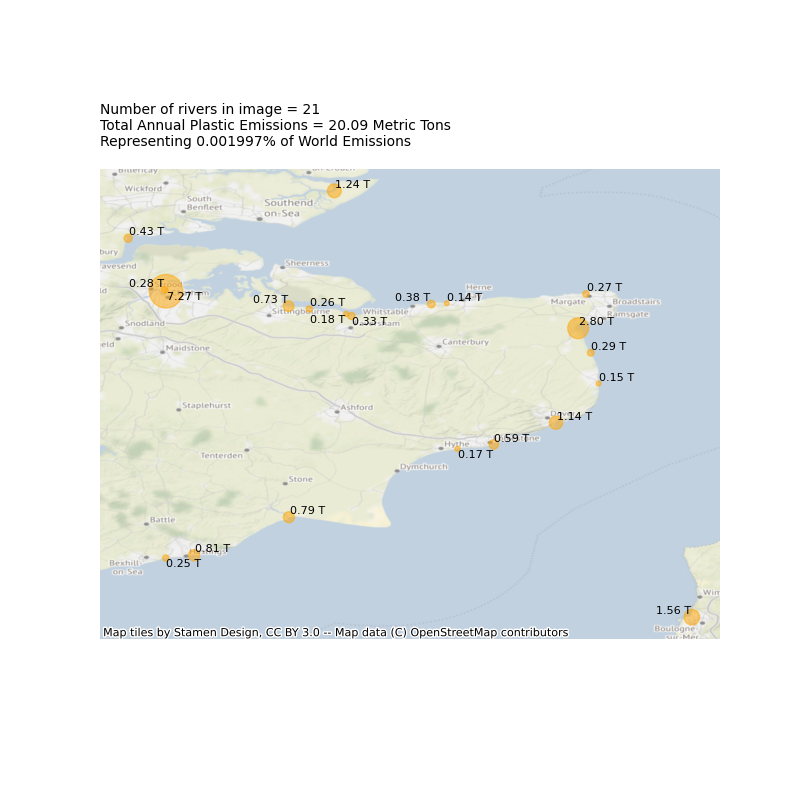

In [33]:
local_config = {
    'color' : 'orange',
    'scale' : 4,
    'bg_alpha' : .6
}

local_rivers(50.6, 51.6, .4, 1.6, local_config)

In [34]:
plt.savefig('./river_plastics_SEUK_ZOOM.png', dpi=200, bbox_inches='tight', pad_inches = 0)

Each river has a handy label! The ```local_config``` dictionary allows you to control things like the marker colour, scale the markers, and change the background opacity.
Try out the config below with your latitude/longitudes. What does it do?

You can now alter the config as much as you like using the function docstring as guidance.

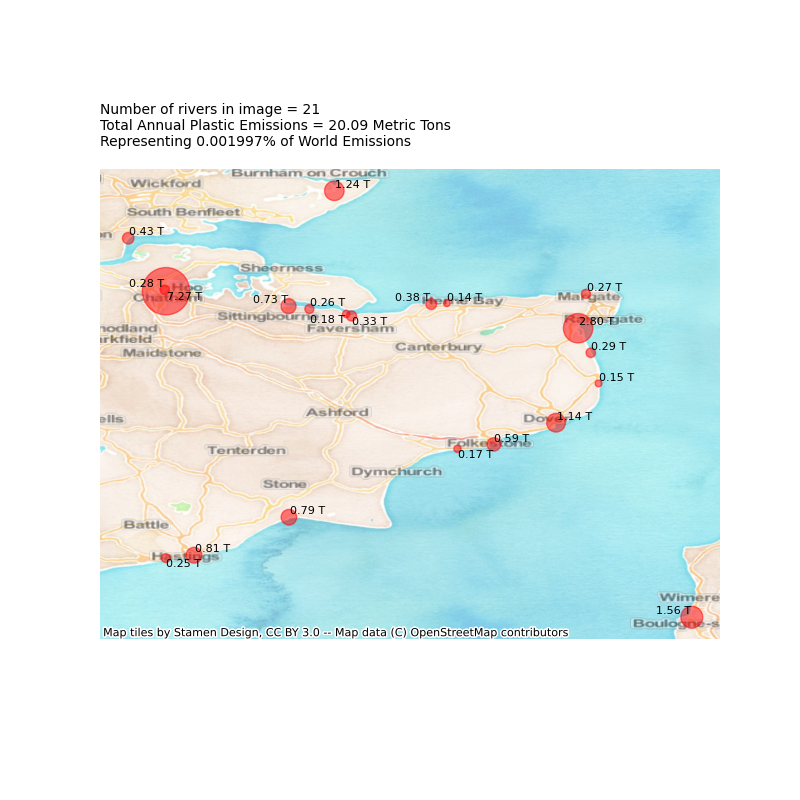

In [35]:
local_config = {
    'color' : 'red',
    'scale' : 8,
    'style': 'watercolour',
    'bg_alpha' : .5
}

local_rivers(50.6, 51.6, .4, 1.6, local_config)

In [36]:
plt.savefig('./river_plastics_SEUK_ZOOM_watercolour.png', dpi=200, bbox_inches='tight', pad_inches = 0)

Have a go at doing some other areas you're interested in. Do you know any of the rivers whose outlets are plotted?

## Saving your Work

Always save your work at the end and download the **.ipynb** and other files you need to keep!

## Over to You <a class="anchor" id="OTY"></a>

Have a go at the tasks below. I haven't provided solutions and there are probably a few ways to solve each one! Remember if you are stuck you can consult the Python and NumPy docs at https://docs.python.org/3/, and https://numpy.org/doc/stable/, find help from one of these websites www.w3schools.com, www.python.org, www.learnpython.org or you can also get advice from www.stackoverflow.com. You can also ask your instructor for help or email me at astrodimitrios@gmail.com.

**Task 1:** Go back to the custom plot where we added all the rivers. Alter the plot to show labels for the largest polluting rivers. You can also try highlighting different rivers based off percentiles.      
**Task 2:** Alter the chloropleth plot so that the largest 10 countries are plotted separetly with a different colourscheme to the rest of the countries.     
**Task 3:** Create a new local river plot and annotate the names of some river outlets on the figure.      
**Task 4:** Check out the #TeamSeas campaign and the Ocean Cleanup Project by clicking on the links at the start.

In [37]:
# Your code here:


## References <a class="anchor" id="REF"></a>

Data from here Meijer L. J. J. et al., 2021, *Sci. Adv.*, More than 1000 rivers account for 80% of global riverine plastic emissions into the ocean, DOI: [10.1126/sciadv.aaz5803](10.1126/sciadv.aaz5803) which is provided [here](https://figshare.com/articles/dataset/Supplementary_data_for_More_than_1000_rivers_account_for_80_of_global_riverine_plsatic_emissions_into_the_ocean_/14515590)

## Acknowledgements <a class="anchor" id="ACK"></a>

Thanks to Lourens Meijer from the Ocean Cleanup for clarifying my question on the geospatial dataset.

## Sharing

If you share, use or modify this activity in any way use the citation in this [txt file](https://github.com/astroDimitrios/Astronomy/blob/master/CITATION.txt).    
Please contact me at astrodimitrios@gmail.com with any suggestions, mistakes found, or general questions about teaching astronomy with Python.

© Dimitrios Theodorakis GNU General Public License v3.0 
https://github.com/astroDimitrios/Astronomy  